
## Use AFragmenter to split full-length AF2 model into smaller domains

May be useful to split large model into smaller domains to analyse each domain separately.

Original publication on github: https://github.com/sverwimp/AFragmenter

My own fork to make modification (`Meng` branch): https://github.com/meng-yx/AFragmenter.git 

┏━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┓
┃ Domain ┃ Number of Residues ┃       Chopping ┃
┡━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━┩
│ 1      │                825 │ 1-393_709-1140 │
│ 2      │                315 │        394-708 │
└────────┴────────────────────┴────────────────┘


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

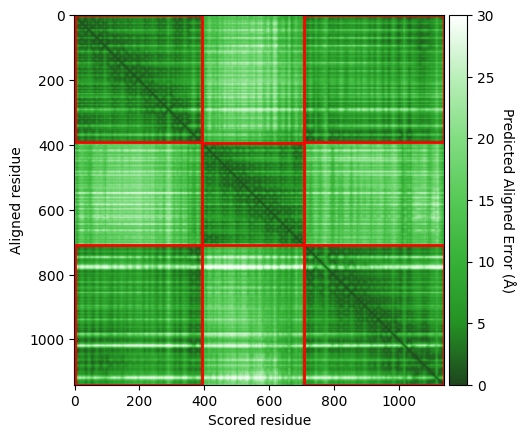

In [3]:
import sys

from afragmenter import AFragmenter, fetch_afdb_data

pae, structure, structure_basename = fetch_afdb_data('Q16531', structure_format='pdb')
fragmenter = AFragmenter(pae) # Or bring your own files: a = AFragmenter('filename.json')
#fragmenter.plot_pae()

fragmenter = AFragmenter(pae)
result = fragmenter.cluster(resolution=0.4, objective_function="modularity", min_size=20, min_avg_pae=15)
result.plot_result()
result.print_result()
result.py3Dmol(structure, width=400, height=400)

┏━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┓
┃ Domain ┃ Number of Residues ┃       Chopping ┃
┡━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━┩
│ 1      │                 12 │           1-12 │
│ 2      │                296 │ 13-171_178-314 │
│ 3      │                  6 │        172-177 │
└────────┴────────────────────┴────────────────┘


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

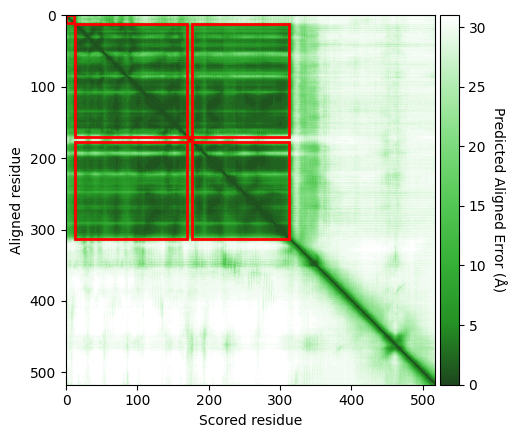

In [6]:
# The default workflow in AFragmenter uses find_cluster_intervals() to break down the clusters into smaller intervals
# A interval is defined as a continuous segment of residues that are part of the same cluster.
# This results in small loops being excluded from a domain (e.g. the activation loop of a kinase).

from afragmenter import AFragmenter, fetch_afdb_data

pae, structure, structure_basename = fetch_afdb_data('Q9Y572')
fragmenter = AFragmenter(pae) # Or bring your own files: a = AFragmenter('filename.json')
#fragmenter.plot_pae()

fragmenter = AFragmenter(pae)
result = fragmenter.cluster(resolution=0.4, objective_function="modularity", min_size=1, min_avg_pae=15)

result.plot_result()
result.print_result()
result.py3Dmol(structure, width=400, height=400)

┏━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━┓
┃ Domain ┃ Number of Residues ┃ Chopping ┃
┡━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━┩
│ 1      │                302 │   13-314 │
└────────┴────────────────────┴──────────┘


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

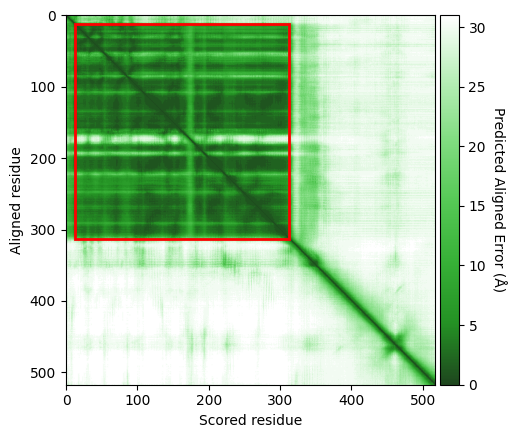

In [ ]:
#-------- Set collapse_intervals to True to prevent small loops from being excluded -------

from afragmenter import AFragmenter, fetch_afdb_data
from AFragmenter.afragmenter.intervals import remove_enclosed_clusters


pae, structure, structure_basename = fetch_afdb_data('Q9Y572')
fragmenter = AFragmenter(pae) # Or bring your own files: a = AFragmenter('filename.json')
#fragmenter.plot_pae()

fragmenter = AFragmenter(pae)
result = fragmenter.cluster(resolution=0.4, objective_function="modularity", min_size=20, min_avg_pae=15, collapse_intervals=True)

result.plot_result()
result.print_result()
result.py3Dmol(structure, width=400, height=400)

┏━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓
┃ Domain ┃ Number of Residues ┃  Chopping ┃
┡━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩
│ 1      │                604 │    19-622 │
│ 2      │                297 │   423-719 │
│ 3      │                214 │   720-933 │
│ 4      │                 67 │ 1042-1108 │
└────────┴────────────────────┴───────────┘


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

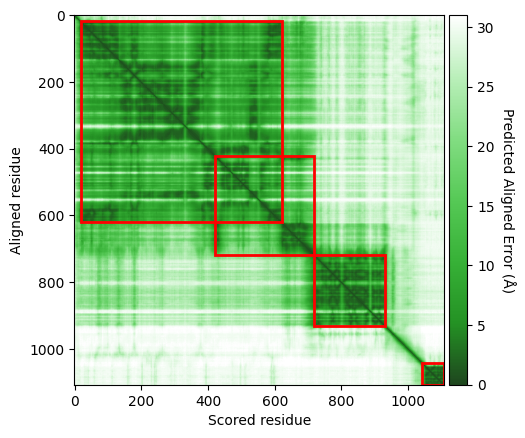

In [ ]:
# However, with collapse_intervals=True, clusters may overlap. 
# We need to use max_overlap to prevent this.

from afragmenter import AFragmenter, fetch_afdb_data
from AFragmenter.afragmenter.intervals import remove_enclosed_clusters

pae, structure, structure_basename = fetch_afdb_data('Q12965')
fragmenter = AFragmenter(pae) # Or bring your own files: a = AFragmenter('filename.json')
#fragmenter.plot_pae()

fragmenter = AFragmenter(pae)
result = fragmenter.cluster(resolution=0.4, objective_function="modularity", min_size=20, min_avg_pae=15, collapse_intervals=True)

result.plot_result()
result.print_result()
result.py3Dmol(structure, width=400, height=400)

┏━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓
┃ Domain ┃ Number of Residues ┃  Chopping ┃
┡━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩
│ 1      │                604 │    19-622 │
│ 2      │                 97 │   623-719 │
│ 3      │                214 │   720-933 │
│ 4      │                 67 │ 1042-1108 │
└────────┴────────────────────┴───────────┘


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

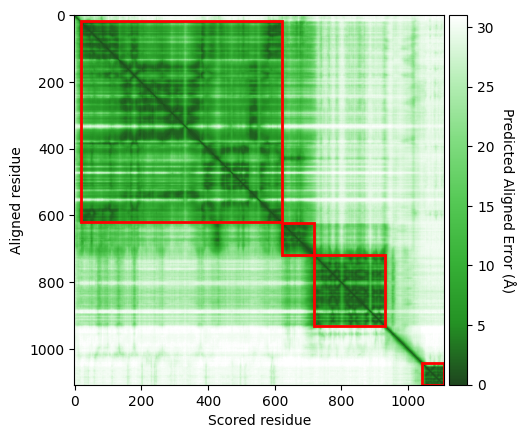

In [ ]:
# Setting max_overlap lets you control the maximum allowed overlapping residues between domains.
# If the overlap exceeds max_overlap, the algorithm considers four ways to resolve it, then chooses the one minimizing the total weighted (by cluster size) mean PAE:
#   1. Assign the overlap to domain 1 only.
#   2. Assign the overlap to domain 2 only.
#   3. Merge both domains into one.

from afragmenter import AFragmenter, fetch_afdb_data

pae, structure, structure_basename = fetch_afdb_data('Q12965')
fragmenter = AFragmenter(pae) # Or bring your own files: a = AFragmenter('filename.json')
#fragmenter.plot_pae()

fragmenter = AFragmenter(pae)
result = fragmenter.cluster(resolution=0.4, objective_function="modularity", min_size=20, min_avg_pae=15, collapse_intervals=True, max_overlap=40)

result.plot_result()
result.print_result()
result.py3Dmol(structure, width=400, height=400)


┏━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━┓
┃ Domain ┃ Number of Residues ┃ Chopping ┃
┡━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━┩
│ 1      │                275 │   51-325 │
│ 2      │                293 │  326-618 │
└────────┴────────────────────┴──────────┘


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

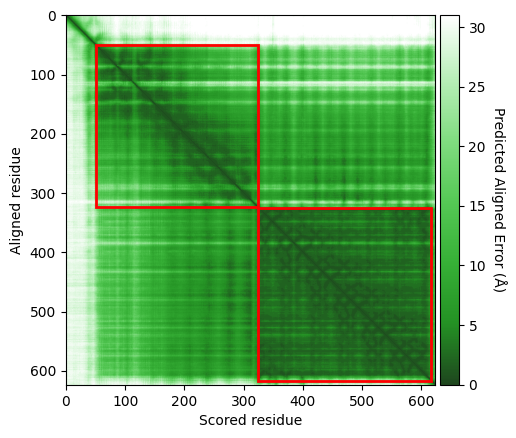

In [ ]:
from afragmenter import AFragmenter, fetch_afdb_data

pae, structure, structure_basename = fetch_afdb_data('Q14145')
fragmenter = AFragmenter(pae) # Or bring your own files: a = AFragmenter('filename.json')
#fragmenter.plot_pae()

fragmenter = AFragmenter(pae)
result = fragmenter.cluster(resolution=0.4, objective_function="modularity", min_size=30, min_avg_pae=15, collapse_intervals=True, max_overlap=40)

result.plot_result()
result.print_result()
result.py3Dmol(structure, width=400, height=400)

┏━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━┓
┃ Domain ┃ Number of Residues ┃ Chopping ┃
┡━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━┩
│ 1      │                 44 │     1-44 │
│ 2      │                298 │   45-342 │
└────────┴────────────────────┴──────────┘


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

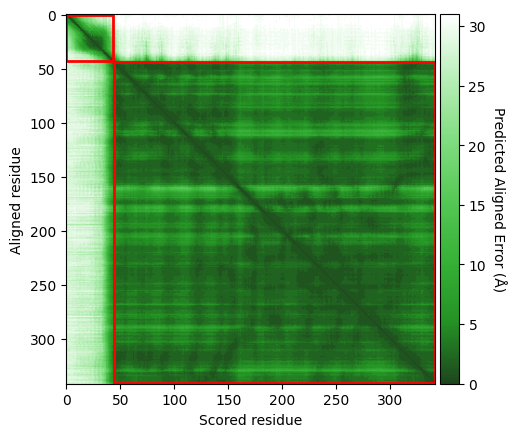

In [26]:
from afragmenter import AFragmenter, fetch_afdb_data

pae, structure, structure_basename = fetch_afdb_data('Q11130')
fragmenter = AFragmenter(pae) # Or bring your own files: a = AFragmenter('filename.json')
#fragmenter.plot_pae()

fragmenter = AFragmenter(pae)
result = fragmenter.cluster(resolution=0.4, objective_function="modularity", min_size=30, min_avg_pae=15, collapse_intervals=True, max_overlap=40)

result.plot_result()
result.print_result()
result.py3Dmol(structure, width=400, height=400)

In [19]:
import numpy as np
import pandas as pd

from afragmenter.intervals import calculate_cluster_average_pae

def result_to_domain_df(result, include_disordered: bool = True):
    """
    Build a DataFrame with columns:
      - domain      : positive ints for domains, negative for non-domain regions
      - n_residues  : number of residues in the region
      - resi_start  : 1-based start residue index (inclusive)
      - resi_end    : 1-based end residue index (inclusive)
      - mean_pae    : average PAE over all residue pairs in the region
      - sequence    : amino acid sequence for the region

    Uses the full sequence from result.sequence_reader.sequence.
    Assumes result.cluster_intervals uses 0-based [start, end] indices (inclusive).
    """
    if result.sequence_reader is None or not hasattr(result.sequence_reader, "sequence"):
        raise ValueError(
            "result.sequence_reader.sequence is not available. "
            "Make sure you constructed AFragmenter with a sequence_file."
        )

    full_seq = result.sequence_reader.sequence
    pae = result.pae_matrix
    n_res = pae.shape[0]
    intervals = result.cluster_intervals  # {cluster_id: [(start, end), ...]} 0-based
    rows = []

    def min_start(segs):
        return min(s for s, _ in segs)

    # Domains (positive ids)
    for cid, segs in intervals.items():
        resi_start0 = min_start(segs)
        resi_end0 = max(e for _, e in segs)
        n_residues = sum(e - s + 1 for s, e in segs)
        mean_pae = float(calculate_cluster_average_pae(pae, segs))

        # 1-based indices
        resi_start = resi_start0 + 1
        resi_end = resi_end0 + 1

        # Concatenate potentially multiple segments in sequence order
        segs_sorted = sorted(segs, key=lambda x: x[0])
        seq_segments = [full_seq[s:e+1] for s, e in segs_sorted]
        seq_region = "".join(seq_segments)

        rows.append({
            "domain": cid + 1,
            "n_residues": n_residues,
            "resi_start": resi_start,
            "resi_end": resi_end,
            "mean_pae": mean_pae,
            "sequence": seq_region,
            "_start": resi_start0,
        })

    if include_disordered:
        covered = np.zeros(n_res, dtype=bool)
        for segs in intervals.values():
            for s, e in segs:
                covered[s:e+1] = True

        neg_id = -1
        i = 0
        while i < n_res:
            if covered[i]:
                i += 1
                continue
            start = i
            while i < n_res and not covered[i]:
                i += 1
            end = i - 1
            segs = [(start, end)]
            n_residues = end - start + 1
            mean_pae = float(calculate_cluster_average_pae(pae, segs))

            resi_start = start + 1
            resi_end = end + 1
            seq_region = full_seq[start:end+1]

            rows.append({
                "domain": neg_id,
                "n_residues": n_residues,
                "resi_start": resi_start,
                "resi_end": resi_end,
                "mean_pae": mean_pae,
                "sequence": seq_region,
                "_start": start,
            })
            neg_id -= 1

    df = pd.DataFrame(rows).sort_values("_start").drop(columns=["_start"]).reset_index(drop=True)
    return df

In [24]:
df_result = result_to_domain_df(result)
# Insert structure_basename as the first column
df_result.insert(0, 'structure', structure_basename)
df_result

,structure,domain,n_residues,resi_start,resi_end,mean_pae,sequence
0,AF-Q8IZT6-2-F1-model_v6.cif,1,34,1,34,13.622503,MANRRVGRGCWEVSPTERRPPAGLRGPAAEEEAS
1,AF-Q8IZT6-2-F1-model_v6.cif,2,129,35,163,9.322959,SPPVLSLSHFCRSPFLCFGDVLLGASRTLSLALDNPNEEVAEVKIS...
2,AF-Q8IZT6-2-F1-model_v6.cif,-1,528,164,691,26.362331,SHNRRVSNIQNVNKTFSVSQKVDRVRSPLQACENLAMNEGGPPTEN...
3,AF-Q8IZT6-2-F1-model_v6.cif,3,577,692,1268,13.525457,DERWKEKQEQGFTWWLNFILTPDDFTVKTNISEVNAATLLLGIENQ...
4,AF-Q8IZT6-2-F1-model_v6.cif,7,103,1269,1371,13.731880,AARLIQTTWRKYKLKTDLKRHQEREKAARIIQLAVINFLAKQRLRK...
5,AF-Q8IZT6-2-F1-model_v6.cif,-2,288,1372,1659,22.863966,AACKIQAWYRCWRAHKEYLAILKAVKIIQGCFYTKLERTRFLNVRA...
6,AF-Q8IZT6-2-F1-model_v6.cif,8,233,1660,1892,7.755554,EENKLYKRTALALHYLLTYKHLSAILEALKHLEVVTRLSPLCCENM...


In [ ]:
import os
import numpy as np
import pandas as pd

from afragmenter.intervals import calculate_cluster_average_pae
from afragmenter import AFragmenter, fetch_afdb_data

#---------- Function to convert result to domain DataFrame ----------
def result_to_domain_df(result, include_disordered: bool = True):
    """
    Build a DataFrame with columns:
      - domain      : positive ints for domains, negative for non-domain regions
      - n_residues  : number of residues in the region
      - resi_start  : 1-based start residue index (inclusive)
      - resi_end    : 1-based end residue index (inclusive)
      - mean_pae    : average PAE over all residue pairs in the region
      - sequence    : amino acid sequence for the region

    Uses the full sequence from result.sequence_reader.sequence.
    Assumes result.cluster_intervals uses 0-based [start, end] indices (inclusive).
    """
    if result.sequence_reader is None or not hasattr(result.sequence_reader, "sequence"):
        raise ValueError(
            "result.sequence_reader.sequence is not available. "
            "Make sure you constructed AFragmenter with a sequence_file."
        )

    full_seq = result.sequence_reader.sequence
    pae = result.pae_matrix
    n_res = pae.shape[0]
    intervals = result.cluster_intervals  # {cluster_id: [(start, end), ...]} 0-based
    rows = []

    def min_start(segs):
        return min(s for s, _ in segs)

    # Domains (positive ids)
    for cid, segs in intervals.items():
        resi_start0 = min_start(segs)
        resi_end0 = max(e for _, e in segs)
        n_residues = sum(e - s + 1 for s, e in segs)
        mean_pae = float(calculate_cluster_average_pae(pae, segs))

        # 1-based indices
        resi_start = resi_start0 + 1
        resi_end = resi_end0 + 1

        # Concatenate potentially multiple segments in sequence order
        segs_sorted = sorted(segs, key=lambda x: x[0])
        seq_segments = [full_seq[s:e+1] for s, e in segs_sorted]
        seq_region = "".join(seq_segments)

        rows.append({
            "domain": cid + 1,
            "n_residues": n_residues,
            "resi_start": resi_start,
            "resi_end": resi_end,
            "mean_pae": mean_pae,
            "sequence": seq_region,
            "_start": resi_start0,
        })

    if include_disordered:
        covered = np.zeros(n_res, dtype=bool)
        for segs in intervals.values():
            for s, e in segs:
                covered[s:e+1] = True

        neg_id = -1
        i = 0
        while i < n_res:
            if covered[i]:
                i += 1
                continue
            start = i
            while i < n_res and not covered[i]:
                i += 1
            end = i - 1
            segs = [(start, end)]
            n_residues = end - start + 1
            mean_pae = float(calculate_cluster_average_pae(pae, segs))

            resi_start = start + 1
            resi_end = end + 1
            seq_region = full_seq[start:end+1]

            rows.append({
                "domain": neg_id,
                "n_residues": n_residues,
                "resi_start": resi_start,
                "resi_end": resi_end,
                "mean_pae": mean_pae,
                "sequence": seq_region,
                "_start": start,
            })
            neg_id -= 1

    df = pd.DataFrame(rows).sort_values("_start").drop(columns=["_start"]).reset_index(drop=True)
    return df
